In [373]:
import os, glob, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import balltracking.balltrack as blt
import fitsio
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
%matplotlib inline
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import colorbar, patches
plt.rcParams.update({'font.size': 16})

In [383]:
ibisdir = Path(os.environ['DATA'], 'Ben', 'IBIS')
vfiles = [sorted(list(ibisdir.rglob('white_light/balltrack/vxy_boxcar_fwhm_37_*.npz'))),
          sorted(list(ibisdir.rglob('Fe7090/balltrack/vxy_boxcar_fwhm_37_*.npz')))]
imfiles = str(ibisdir.joinpath('Fe7090/ibis.fe7090.speckle.cropped.fits'))
display(sorted(vfiles[0]), sorted(vfiles[1]))

[PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_000_150.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_075_225.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_150_300.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_225_375.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_300_450.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_375_525.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_450_600.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_525_675.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_600_750.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/white_light/balltrack/vxy_boxcar_fwhm_37_trange_675_825.npz')]

[PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_000_150.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_075_225.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_150_300.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_225_375.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_300_450.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_375_525.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_450_600.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_525_675.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_600_750.npz'),
 PosixPath('/mnt/data2/Ben/IBIS/Fe7090/balltrack/vxy_boxcar_fwhm_37_trange_675_825.npz')]

In [390]:
with np.load(vfiles[0][0]) as data:
    vx_wl = data['vx_cal']
    vy_wl = data['vy_cal']
    lanes_wl = data['lanes']

with np.load(vfiles[1][0]) as data:
    vx_fe = data['vx_cal']
    vy_fe = data['vy_cal']
    lanes_fe = data['lanes']

data = fitsio.read(imfiles)
data0 = data[4:304,...].mean(axis=0)

In [449]:
def quiver_plot(ax, vx, vy, step=1, dx=1, vunit=1, scale=30, shaftwidth=0.1, headwidth=3, headlength=4, headaxislength=4.5, title='', axis=None):
    v_slice = np.s_[::step, ::step]
    # Grid of the flow fields, first define the default, then slice it to match anchors spaced by "step" pixels
    x, y = np.meshgrid(np.arange(vx.shape[0]), np.arange(vx.shape[1]))
    x = x[v_slice]*dx
    y = y[v_slice]*dx
    # Slice the velocity to match anchor spacing
    vx_s = vx[v_slice] * vunit
    vy_s = vy[v_slice] * vunit

    ### norm of velocity for color mapping
    # vnorm = np.sqrt(vx_s ** 2 + vy_s ** 2)
    
    quiv = ax.quiver(x, y, vx_s, vy_s,
               units='xy', scale=scale, width=shaftwidth, headwidth=headwidth, headlength=headlength, headaxislength=headaxislength, label='V (m/s)')
    ax.set_aspect('equal')
    ax.axis([0, vx.shape[1]*dx, 0, vx.shape[0]*dx])
    
    if axis is not None:
        ax.axis(axis)
        
    ax.set_xlabel('x [Mm]')
    ax.set_ylabel('y [Mm]')

    return quiv

## Quiver - White light

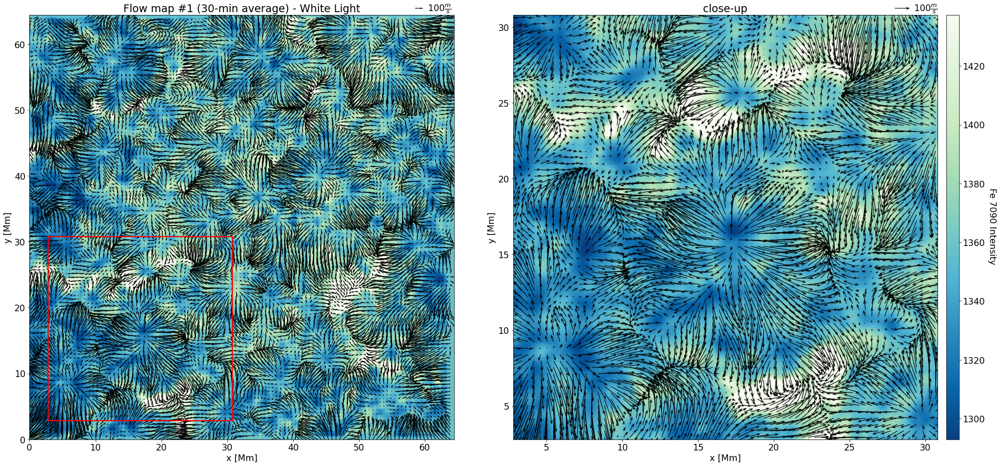

In [410]:
vunit = 70000/12
dx = 70*0.001
cmap = 'GnBu_r'
extent = np.array([0, 920, 0, 920])*dx
vmin, vmax = np.percentile(data0, 0.1), np.percentile(data0, 98)
axis = np.array([40, 440, 40, 440])*dx
fov = 400*dx

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 12))
axs[0].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q1 = quiver_plot(axs[0], vx_wl, vy_wl, step=8, dx=dx, vunit=vunit, scale=400, shaftwidth=0.1, headwidth=2, headlength=4, headaxislength=4.5)
axs[0].set_title('Flow map #1 (30-min average) - White Light')
qk1 = axs[0].quiverkey(q1, 0.43, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
rect = patches.Rectangle((axis[0], axis[2]), fov, fov, linewidth=2, edgecolor='r', facecolor='none')
axs[0].add_patch(rect)

im2 = axs[1].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q2 = quiver_plot(axs[1], vx_wl, vy_wl, step=6, dx=dx, vunit=vunit, scale=500, shaftwidth=0.04, headwidth=5, headlength=7, headaxislength=4.5, axis=axis)
qk2 = axs[1].quiverkey(q2, 0.9, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
axs[1].set_title('close-up')
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="3%", pad="2%")
cb2 = fig.colorbar(im2, cax=cax, orientation="vertical")
cb2.set_label('Fe 7090 Intensity ', labelpad=20.0, rotation=270)

plt.tight_layout()
plt.savefig(str(Path(ibisdir,'white_light','quiver_wl.jpg')))

## Quiver - Fe7090 

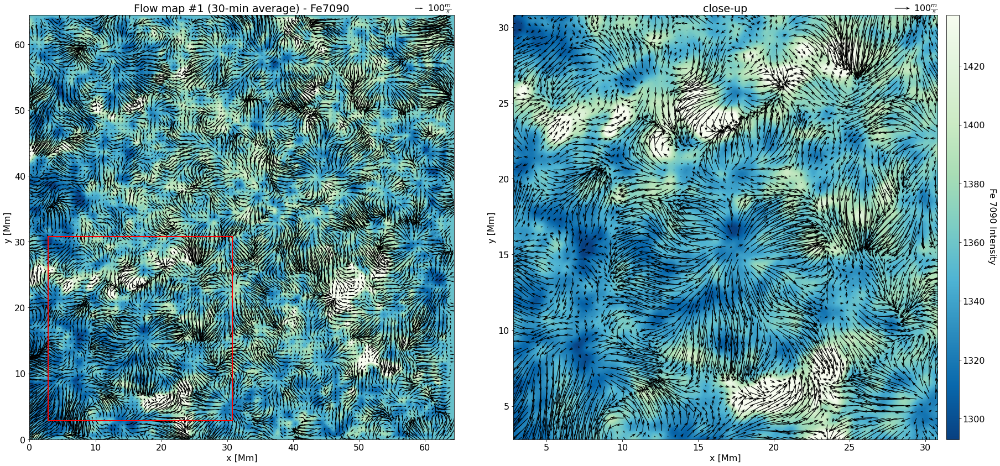

In [415]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 12))
axs[0].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q1 = quiver_plot(axs[0], vx_fe, vy_fe, step=8, dx=dx, vunit=vunit, scale=400, shaftwidth=0.1, headwidth=2, headlength=4, headaxislength=4.5)
axs[0].set_title('Flow map #1 (30-min average) - Fe7090')
qk1 = axs[0].quiverkey(q1, 0.43, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
rect = patches.Rectangle((axis[0], axis[2]), fov, fov, linewidth=2, edgecolor='r', facecolor='none')
axs[0].add_patch(rect)

im2 = axs[1].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q2 = quiver_plot(axs[1], vx_fe, vy_fe, step=6, dx=dx, vunit=vunit, scale=500, shaftwidth=0.04, headwidth=5, headlength=7, headaxislength=4.5, axis=axis)
qk2 = axs[1].quiverkey(q2, 0.9, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
axs[1].set_title('close-up')
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="3%", pad="2%")
cb2 = fig.colorbar(im2, cax=cax, orientation="vertical")
cb2.set_label('Fe 7090 Intensity ', labelpad=20.0, rotation=270)

plt.tight_layout()
plt.savefig(str(Path(ibisdir,'Fe7090','quiver_fe.jpg')))

## Supergranular maps - White Light

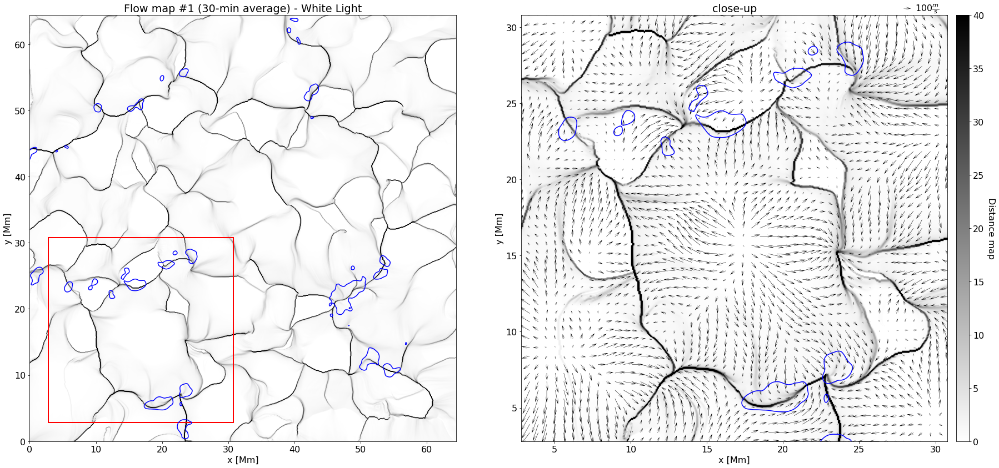

In [412]:
vunit = 70000/12
dx = 70*0.001
cmap = 'GnBu_r'
extent = np.array([0, 920, 0, 920])*dx
vmin, vmax = np.percentile(data0, 0.1), np.percentile(data0, 98)


fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 12))
axs[0].imshow(lanes_wl, origin='lower', cmap='gray_r', extent=extent, vmin=0, vmax=40)
axs[0].contour(data0, [1450], extent=extent, colors='blue')
axs[0].set_title('Flow map #1 (30-min average) - White Light')
rect = patches.Rectangle((axis[0], axis[2]), fov, fov, linewidth=2, edgecolor='r', facecolor='none')
axs[0].add_patch(rect)
axs[0].set_xlabel('x [Mm]')
axs[0].set_ylabel('y [Mm]')

im2 = axs[1].imshow(lanes_wl, origin='lower', cmap = 'gray_r',  extent=extent, vmin=0, vmax=40)
q2 = quiver_plot(axs[1], vx, vy, step=8, dx=dx, vunit=vunit, scale=1000, shaftwidth=0.02, headwidth=10, headlength=20, headaxislength=7, axis=axis)
qk2 = axs[1].quiverkey(q2, 0.9, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
#axs[1].axis(np.array([40, 440, 40, 440])*dx)
axs[1].contour(data0, [1450], extent=extent, colors='blue')


axs[1].set_title('close-up')
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="3%", pad="2%")
cb2 = fig.colorbar(im2, cax=cax, orientation="vertical")
cb2.set_label('Distance map', labelpad=20.0, rotation=270)

plt.tight_layout()

plt.savefig(str(Path(ibisdir,'white_light','lanes_wl.jpg')))

## Supergranular Maps - Fe7090

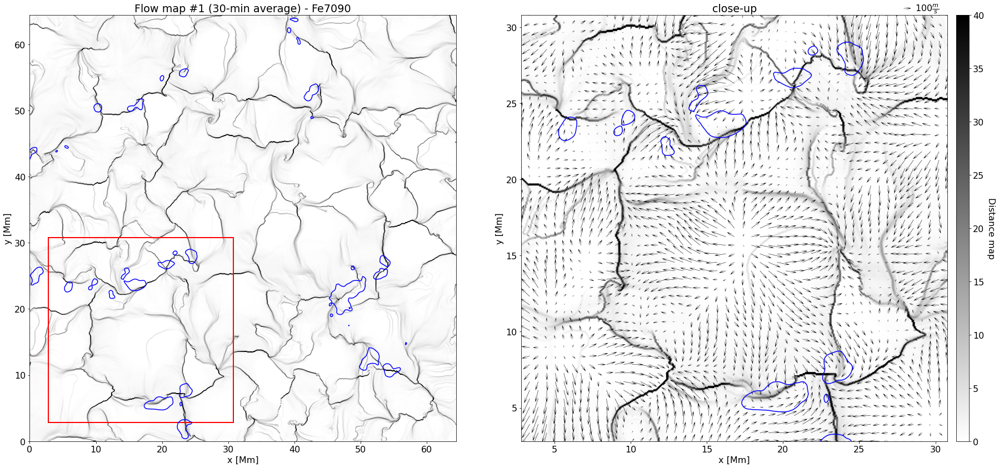

In [414]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 12))
axs[0].imshow(lanes_fe, origin='lower', cmap='gray_r', extent=extent, vmin=0, vmax=40)
axs[0].contour(data0, [1450], extent=extent, colors='blue')
axs[0].set_title('Flow map #1 (30-min average) - Fe7090')
rect = patches.Rectangle((axis[0], axis[2]), fov, fov, linewidth=2, edgecolor='r', facecolor='none')
axs[0].add_patch(rect)
axs[0].set_xlabel('x [Mm]')
axs[0].set_ylabel('y [Mm]')

im2 = axs[1].imshow(lanes_fe, origin='lower', cmap = 'gray_r',  extent=extent, vmin=0, vmax=40)
q2 = quiver_plot(axs[1], vx, vy, step=8, dx=dx, vunit=vunit, scale=1000, shaftwidth=0.02, headwidth=10, headlength=20, headaxislength=7, axis=axis)
qk2 = axs[1].quiverkey(q2, 0.9, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
#axs[1].axis(np.array([40, 440, 40, 440])*dx)
axs[1].contour(data0, [1450], extent=extent, colors='blue')


axs[1].set_title('close-up')
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="3%", pad="2%")
cb2 = fig.colorbar(im2, cax=cax, orientation="vertical")
cb2.set_label('Distance map', labelpad=20.0, rotation=270)

plt.tight_layout()
plt.savefig(str(Path(ibisdir,'Fe7090','lanes_fe.jpg')))

In [457]:
from scipy.signal import convolve2d

vunit = 70000/12
deepvx = np.load(Path(ibisdir, 'white_light', 'deepvelu_output_tau_1', 'vx.npy'))[0,...]*1000 / vunit
deepvy = np.load(Path(ibisdir, 'white_light', 'deepvelu_output_tau_1', 'vy.npy'))[0,...]*1000 / vunit

fwhm = 37
box = np.ones([fwhm, fwhm]) / fwhm**2
deepvx = convolve2d(deepvx, box, mode='same')
deepvy = convolve2d(deepvy, box, mode='same')

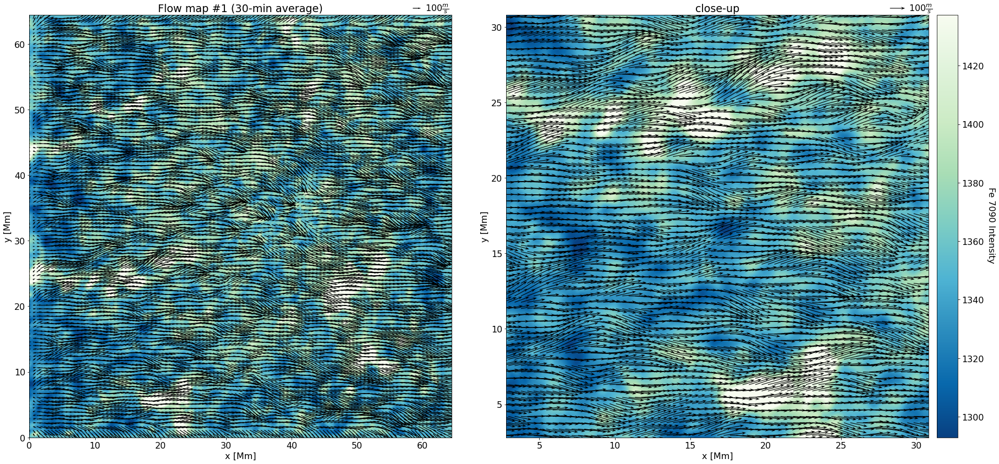

In [468]:
dx = 70*0.001
cmap = 'GnBu_r'
extent = np.array([0, 920, 0, 920])*dx
vmin, vmax = np.percentile(data0, 0.1), np.percentile(data0, 98)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 12))
axs[0].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q1 = quiver_plot(axs[0], deepvx, deepvy, step=8, dx=dx, vunit=vunit, scale=400, shaftwidth=0.1, headwidth=2, headlength=4, headaxislength=4.5)
axs[0].set_title('Flow map #1 (30-min average)')
qk1 = axs[0].quiverkey(q1, 0.43, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')


im2 = axs[1].imshow(data0, origin='lower', extent=extent, cmap = cmap, vmin=vmin, vmax=vmax)
q2 = quiver_plot(axs[1], deepvx, deepvy, step=6, dx=dx, vunit=vunit, scale=500, shaftwidth=0.04, headwidth=5, headlength=7, headaxislength=4.5, axis=np.array([40, 440, 40, 440])*dx)
qk2 = axs[1].quiverkey(q2, 0.9, 0.97, 500, r'$100 \frac{m}{s}$', labelpos='E', coordinates='figure')
axs[1].set_title('close-up')
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad="2%")
cb2 = fig.colorbar(im2, cax=cax, orientation="vertical")
cb2.set_label('Fe 7090 Intensity ', labelpad=20.0, rotation=270)
plt.tight_layout()
plt.show()

In [459]:
deepvx.mean() * vunit

637.3799215376589